In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import glob

from tensorflow import keras
from keras import layers
from keras.models import Sequential
import tensorflow as tf
from keras.utils import image_dataset_from_directory
from pathlib import Path
from PIL import Image


import albumentations as A
import cv2
import os
import random

from tqdm import tqdm
from albumentations import Compose
from pathlib import Path
from albumentations import augmentations, crop, transforms

2023-05-24 15:35:50.468275: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-24 15:35:50.673775: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-05-24 15:35:51.362538: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64::/usr/local/cuda/lib64:/usr/local/cuda/extras/CUPTI/lib64
2023-05

In [2]:
directory = Path("/home/vlachoum/PROJECT/FeatureExtractionProject-git")

Data augmentation

In [3]:
for root, sub_folders, files in os.walk(directory):
    print(root, sub_folders, files)


/home/vlachoum/PROJECT/FeatureExtractionProject-git ['viz_data', '.git', 'transformed_data', 'data', 'notebooks', 'models'] ['stitched_filters_resnet_50epochs_conv3block4.png', '.DS_Store', 'test.png', 'data_augmentation_trin_viz_filters.ipynb', 'matenia_filter_0.png', 'homemade_filter_0.png', 'README.md', '0.png']
/home/vlachoum/PROJECT/FeatureExtractionProject-git/viz_data [] ['Egerton821_f55v0.png', 'test.png']
/home/vlachoum/PROJECT/FeatureExtractionProject-git/.git ['refs', 'logs', 'info', 'objects', 'hooks'] ['COMMIT_EDITMSG', 'description', 'packed-refs', 'index', 'HEAD', 'FETCH_HEAD', 'config']
/home/vlachoum/PROJECT/FeatureExtractionProject-git/.git/refs ['heads', 'tags', 'remotes'] []
/home/vlachoum/PROJECT/FeatureExtractionProject-git/.git/refs/heads [] ['main', 'matenia']
/home/vlachoum/PROJECT/FeatureExtractionProject-git/.git/refs/tags [] []
/home/vlachoum/PROJECT/FeatureExtractionProject-git/.git/refs/remotes ['origin'] []
/home/vlachoum/PROJECT/FeatureExtractionProject-

In [4]:
def import_paths(directory_path, valid_extensions, suffix=None) :
    
    paths = {}
    
    # Recursive exploration
    for root, sub_folders, files in os.walk(directory_path):
        
        # Remove hidden sub folders
        sub_folders[:] = [d for d in sub_folders if not d[0] == '.']
        
        for f in files:
            
            # Get path, filename and ext of current file
            file_name, ext = os.path.splitext(f)
            file_path = os.path.join(root, f)
            
            # Not valid extension -> ignoring file
            if not any([ext == v for v in valid_extensions]):
                continue

            if suffix is not None :
                if file_name.split('-')[-1] != suffix :
                    continue
            
            # Warning if repeating file
            if file_name in paths:
                print("Repeating files names :")
                print(paths[file_name])
                print(file_path)

            paths[file_name] = file_path
            
    return paths

In [5]:
valid_extensions = [".png"]

In [6]:
files = import_paths(directory, valid_extensions)
files
len(files)

Repeating files names :
/home/vlachoum/PROJECT/FeatureExtractionProject-git/test.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/viz_data/test.png
Repeating files names :
/home/vlachoum/PROJECT/FeatureExtractionProject-git/viz_data/Egerton821_f55v0.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/Egerton821_f55v0.png


71122

In [7]:
transform_test = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.8),
    A.RandomCrop(height=256, width=256, p=1.0),
    A.RandomResizedCrop(height=256, width=256, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1, always_apply=False, p=1.0),
    A.Equalize (mode='cv', by_channels=True, mask=None, mask_params=(), always_apply=False, p=0.5),
    A.GaussianBlur (blur_limit=(3, 7), sigma_limit=0, always_apply=False, p=0.5),
])

In [8]:
in_folder = "/home/vlachoum/PROJECT/FeatureExtractionProject-git/data"
out_folder = "/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/"

In [9]:
import shutil

def task(file_name, path, crop_size=(256, 256), out_folder=None):
    img = cv2.imread(path)
    height, width, _ = img.shape
    if height < crop_size[0] or width < crop_size[1]:
        print(f"Image {path} is too small. Skipping...")
        return
    for i in range(200):
        img_tr = transform_test(image=img)['image']
        out_path = os.path.join(out_folder, f"{file_name}-augment{i+1}.png")
        cv2.imwrite(out_path, img_tr)

def apply_transform_to_directory(in_folder, out_folder, task):
    for root, sub_folders, files in os.walk(in_folder):
        sub_folders = [sub_folder for sub_folder in sub_folders if sub_folder.startswith('final_')]
        for sub_folder in sub_folders:
            sub_folder_path = os.path.join(root, sub_folder)
            transformed_subfolder_name = "transformed_" + sub_folder
            transformed_subfolder_path = os.path.join(out_folder, transformed_subfolder_name)
            os.makedirs(transformed_subfolder_path, exist_ok=True)

            for file in os.listdir(sub_folder_path):
                if file == '.ipynb_checkpoints':  # Skip the .ipynb_checkpoints folder
                    continue
                file_path = os.path.join(sub_folder_path, file)
                if os.path.isfile(file_path) and os.path.splitext(file_path)[-1].lower() in ['.jpg', '.jpeg', '.png', '.tif', '.tiff']:
                    file_name = os.path.splitext(file)[0]
                    task(file_name, file_path, out_folder=transformed_subfolder_path)

                    # Move the file to the transformed subfolder
                    destination_path = os.path.join(transformed_subfolder_path, file)
                    shutil.move(file_path, destination_path)

In [10]:
apply_transform_to_directory(in_folder, out_folder, task)

In [10]:
# folder path
dir_path = r'/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/'
count = 0
# Iterate directory
for path in os.listdir(dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(dir_path, path)):
        count += 1
print('File count:', count)

File count: 34776


In [11]:
import os

def list_files_in_subfolders(directory_path):
    for root, directories, files in os.walk(directory_path):
        for directory in directories:
            folder_path = os.path.join(root, directory)
            for file in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file)
                if os.path.isfile(file_path):
                    print(file_path)  # Print file path

directory_path = "/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data"
list_files_in_subfolders(directory_path)


/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/btv1b90600192_f298_1-augment91.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/SaintOmer0289_f3ra-augment25.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/CLM13027_f39r1-augment58.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/Latin6395_f287v-288r3-augment82.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/Latin6395_f288v-289r3-augment120.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/Mazarine915_f4281-augment54.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fort_abbr/CLM13027_f38v0-augment129.png
/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data/transformed_final_fo

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import glob

from tensorflow import keras
from keras import layers
from keras.models import Sequential
import tensorflow as tf
#from keras.utils import image_dataset_from_directory
from pathlib import Path

In [13]:

directory = Path("/home/vlachoum/PROJECT/FeatureExtractionProject-git/transformed_data")

Found 71160 files belonging to 2 classes.


2023-05-23 12:35:16.747195: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46704 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:17:00.0, compute capability: 8.6
2023-05-23 12:35:16.747882: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 46696 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6


<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [14]:
batch_size = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
  directory,
  validation_split=0.2,
  subset="training",
  seed=123,
  batch_size=batch_size)

Found 71160 files belonging to 2 classes.
Using 56928 files for training.


2023-05-24 15:36:36.690342: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46704 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:17:00.0, compute capability: 8.6
2023-05-24 15:36:36.691066: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 46696 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6


In [15]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  directory,
  validation_split=0.2,
  subset="validation",
  seed=123,
  batch_size=batch_size)

Found 71160 files belonging to 2 classes.
Using 14232 files for validation.


In [16]:
class_names = train_ds.class_names
print(class_names)

['transformed_final_faible_abbr', 'transformed_final_fort_abbr']


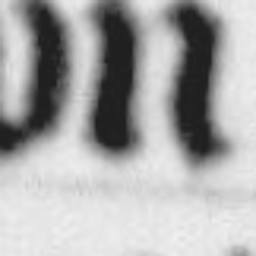

In [17]:
fort_abbr = list(directory.glob('transformed_final_faible_abbr/*'))
PIL.Image.open(str(fort_abbr[0]))

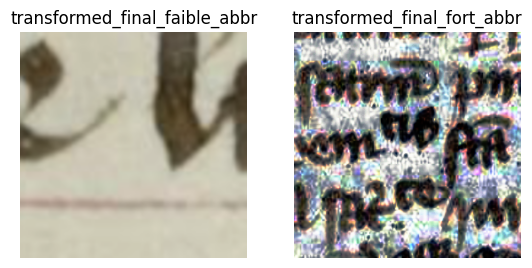

In [18]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(2):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [29]:
from tensorflow.keras.models import Model

#dnn_model = keras.Sequential()

In [21]:
#imported_model= tf.keras.applications.ResNet50(include_top=True,
#input_shape=(256,256,3),
#pooling='avg',classes=2,
#weights= None)
#for layer in imported_model.layers:
  #layer.trainable=True

In [22]:
#imported_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [19]:
import tensorflow as tf  # version 2.5
from tensorflow import keras
from tensorflow.keras.layers import LeakyReLU, Softmax
from tensorflow.keras.layers import Conv2D, MaxPooling2D, SeparableConv2D, ZeroPadding2D
from tensorflow.keras.layers import Dense, Flatten, Dropout, Reshape, Activation
from tensorflow.keras.layers import BatchNormalization

In [20]:
from tensorflow.keras.optimizers import Adam

#imported_model.compile(optimizer=Adam(learning_rate=0.001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [21]:
homemade_model = Sequential()
homemade_model.add(Conv2D(8, kernel_size=3, activation='relu', input_shape=(256, 256, 3), name='conv1'))
homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv2'))
homemade_model.add(MaxPooling2D(pool_size=(2, 2), name='maxpool1'))
homemade_model.add(Dropout(0.25, name='dropout1'))

homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv3'))
homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv4'))
homemade_model.add(MaxPooling2D(pool_size=(2, 2), name='maxpool2'))
homemade_model.add(Dropout(0.25, name='dropout2'))

homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv5'))
homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv6'))
homemade_model.add(MaxPooling2D(pool_size=(2, 2), name='maxpool3'))
homemade_model.add(Dropout(0.25, name='dropout3'))

homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv7'))
homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv8'))
homemade_model.add(MaxPooling2D(pool_size=(2, 2), name='maxpool4'))
homemade_model.add(Dropout(0.25, name='dropout4'))

homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv9'))
homemade_model.add(Conv2D(16, kernel_size=3, activation='relu', name='conv10'))
homemade_model.add(MaxPooling2D(pool_size=(2, 2), name='maxpool5'))
homemade_model.add(Dropout(0.25, name='dropout5'))

homemade_model.add(Flatten())
homemade_model.add(Dense(64, activation='softmax', name='dense1'))


In [22]:
homemade_model.compile(optimizer=Adam(learning_rate=0.001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])
for layer in homemade_model.layers:
    layer.trainable = True

In [23]:
homemade_model.build(input_shape=(256, 256, 3))


In [24]:
homemade_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 254, 254, 8)       224       
                                                                 
 conv2 (Conv2D)              (None, 252, 252, 16)      1168      
                                                                 
 maxpool1 (MaxPooling2D)     (None, 126, 126, 16)      0         
                                                                 
 dropout1 (Dropout)          (None, 126, 126, 16)      0         
                                                                 
 conv3 (Conv2D)              (None, 124, 124, 16)      2320      
                                                                 
 conv4 (Conv2D)              (None, 122, 122, 16)      2320      
                                                                 
 maxpool2 (MaxPooling2D)     (None, 61, 61, 16)        0

 To make the mdoel more efficient, we consider the following modifications:

Use a different activation function: Instead of using softmax activation for the last dense layer, you can switch to a different activation function that suits your specific problem. For example, if you're working on a binary classification task, you can use sigmoid activation.

Reduce the number of parameters: Since you only have two classes, you can reduce the complexity of the model to make it more efficient. Here are some possible modifications:

Decrease the number of filters in the convolutional layers. For example, you can start with fewer filters in the initial layers (e.g., 4 or 6) and gradually increase them if needed.
Reduce the number of convolutional layers. You can remove some of the convolutional layers or merge them together if they have similar patterns.
Decrease the size of the dense layer. Since you have only two classes, you can reduce the number of units in the dense layer (e.g., to 2 or 4).
Use a different pooling strategy: Instead of using max pooling, you can experiment with other pooling techniques such as average pooling or global pooling, which can help reduce the number of parameters.

Apply regularization techniques: Regularization techniques can help prevent overfitting and improve generalization. Consider using techniques such as L1 or L2 regularization, or applying dropout to more layers.

In [48]:
training = homemade_model.fit(
train_ds,
validation_data=val_ds,
epochs=50
)

Epoch 1/50


2023-05-23 13:08:51.536688: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_5/dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-05-23 13:08:53.552275: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8401
2023-05-23 13:08:55.499085: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


1779/1779 [==============================] - 87s 44ms/step - loss: 0.7376 - accuracy: 0.5064 - val_loss: 0.7253 - val_accuracy: 0.4852
Epoch 2/50
1779/1779 [==============================] - 78s 44ms/step - loss: 0.6941 - accuracy: 0.5108 - val_loss: 0.6980 - val_accuracy: 0.4852
Epoch 3/50
1779/1779 [==============================] - 78s 44ms/step - loss: 0.6937 - accuracy: 0.5121 - val_loss: 0.6923 - val_accuracy: 0.5148
Epoch 4/50
1779/1779 [==============================] - 78s 44ms/step - loss: 0.6657 - accuracy: 0.5849 - val_loss: 0.6239 - val_accuracy: 0.6457
Epoch 5/50
1779/1779 [==============================] - 78s 44ms/step - loss: 0.5943 - accuracy: 0.6777 - val_loss: 0.5389 - val_accuracy: 0.7209
Epoch 6/50
1779/1779 [==============================] - 79s 44ms/step - loss: 0.5278 - accuracy: 0.7291 - val_loss: 0.4724 - val_accuracy: 0.7724
Epoch 7/50
1779/1779 [==============================] - 78s 44ms/step - loss: 0.4800 - accuracy: 0.7649 - val_loss: 0.4534 - val_accura

In [58]:
homemade_model.save("/home/vlachoum/PROJECT/FeatureExtractionProject-git/models/homemade_06_2305")

INFO:tensorflow:Assets written to: /home/vlachoum/PROJECT/FeatureExtractionProject-git/models/homemade/homemade_01_2305/assets


INFO:tensorflow:Assets written to: /home/vlachoum/PROJECT/FeatureExtractionProject-git/models/homemade/homemade_01_2305/assets


In [59]:
homemade_model = tf.keras.models.load_model("/home/vlachoum/PROJECT/FeatureExtractionProject-git/models/homemade_06_2305")


In [25]:
homemade_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 254, 254, 8)       224       
                                                                 
 conv2 (Conv2D)              (None, 252, 252, 16)      1168      
                                                                 
 maxpool1 (MaxPooling2D)     (None, 126, 126, 16)      0         
                                                                 
 dropout1 (Dropout)          (None, 126, 126, 16)      0         
                                                                 
 conv3 (Conv2D)              (None, 124, 124, 16)      2320      
                                                                 
 conv4 (Conv2D)              (None, 122, 122, 16)      2320      
                                                                 
 maxpool2 (MaxPooling2D)     (None, 61, 61, 16)        0

In [36]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2


E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


In [29]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# The dimensions of our input image
img_width = 256
img_height = 256

# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "conv10"

In [30]:

# Set up a model that returns the activation values for our target layer
layer = homemade_model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=homemade_model.inputs, outputs=layer.output)


In [31]:
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    if activation.shape[1] >= 4 and activation.shape[2] >= 4:
        filter_activation = activation[:, 2:-2, 2:-2, filter_index]
        return tf.reduce_mean(filter_activation)
    else:
        # Handle cases where the activation tensor has insufficient dimensions
        return tf.constant(0.0)

In [32]:
@tf.function
@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    if grads is not None:
        # Normalize gradients.
        grads = tf.math.l2_normalize(grads)
        img += learning_rate * grads
    return loss, img

In [33]:
import cv2
import numpy as np

def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index):
    # We run gradient ascent for 20 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img

def deprocess_image(img):
    # Convert to floating-point
    img = img.astype(np.float32)

    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    height, width, _ = img.shape
    min_dim = min(height, width)
    start_x = (width - min_dim) // 2
    start_y = (height - min_dim) // 2
    img = img[start_y:start_y+min_dim, start_x:start_x+min_dim, :]

    # Resize to desired size
    img = cv2.resize(img, (256,256))

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img
    return img.shape


In [35]:
from IPython.display import Image, display

loss, img = visualize_filter(0)
keras.utils.save_img("homemade_filter_0.png", img)

In [36]:
loss, img = visualize_filter(3)
keras.utils.save_img("homemade_filter_3.png", img)

In [116]:
img = cv2.imread("homemade_filter_0.png")
img.shape

(256, 256, 3)

### Applicable only to renet filters

In [117]:
import numpy as np
import keras
from IPython.display import Image, display

# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)

# Build a black picture with enough space for
# our 8 x 8 filters of size 256 x 256, with a 5px margin in between
margin = 0
n = 8
img_width = 256
img_height = 256
cropped_width = img_width - margin
cropped_height = img_height - margin
width = n * cropped_width + margin
height = n * cropped_height + margin
stitched_filters = np.zeros((height, width, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_height + margin) * i : (cropped_height + margin) * i + cropped_height,
            (cropped_width + margin) * j : (cropped_width + margin) * j + cropped_width,
            :,
        ] = img

keras.utils.save_img("stitched_filters_homemade_conv10.png", stitched_filters)
display(Image("stitched_filters_homemade_conv10.png"))


Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16


ValueError: in user code:

    File "/tmp/ipykernel_91388/1225212184.py", line 6, in gradient_ascent_step  *
        loss = compute_loss(img, filter_index)
    File "/tmp/ipykernel_91388/3665934206.py", line 4, in compute_loss  *
        filter_activation = activation[:, 2:-2, 2:-2, filter_index]

    ValueError: slice index 16 of dimension 3 out of bounds. for '{{node strided_slice}} = StridedSlice[Index=DT_INT32, T=DT_FLOAT, begin_mask=1, ellipsis_mask=0, end_mask=1, new_axis_mask=0, shrink_axis_mask=8](model_2/conv6/Relu, strided_slice/stack, strided_slice/stack_1, strided_slice/stack_2)' with input shapes: [1,57,57,16], [4], [4], [4] and with computed input tensors: input[1] = <0 2 2 16>, input[2] = <0 -2 -2 17>, input[3] = <1 1 1 1>.
